In [125]:
%run -m ipy_startup
%run -m ipy_logging
%run -m ipy_seaborn
%run -m ipy_plotly
%matplotlib inline
from mgds.data_aggregation import database as db
from mgds.data_aggregation import source as src
from mgds.data_aggregation import io_utils as io

In [4]:
d_ctd = db.load(src.CTD_v2, db.IMPORT, 'drug-sensitivity')
d_ctd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395263 entries, 0 to 395262
Data columns (total 10 columns):
CELL_LINE_ID        395263 non-null object
CELL_LINE_ID:CTD    395263 non-null int64
DRUG_ID:CTD         395263 non-null int64
SMILES              395263 non-null object
DRUG_NAME           395263 non-null object
STATUS              395263 non-null object
DRUG_ID:BROAD       395263 non-null object
AUC                 395263 non-null float64
LOG2_EC50           395263 non-null float64
EXPERIMENT_ID       395263 non-null int64
dtypes: float64(2), int64(3), object(5)
memory usage: 33.2+ MB


In [5]:
d_gdsc = db.load(src.GDSC_v2, db.IMPORT, 'drug-sensitivity')
d_gdsc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 212665 entries, 0 to 224509
Data columns (total 12 columns):
IC50_RESULTS_ID        212665 non-null object
CELL_LINE_ID:COSMIC    212665 non-null object
DRUG_ID:COSMIC         212665 non-null int64
MAX_CONC_MICROMOLAR    212665 non-null float64
LN_IC50                212665 non-null float64
AUC                    212665 non-null float64
RMSE                   212665 non-null float64
DRUG_NAME              212665 non-null object
SYNONYMS               113092 non-null object
TARGET                 211696 non-null object
TARGET_PATHWAY         212665 non-null object
CELL_LINE_ID           205148 non-null object
dtypes: float64(4), int64(1), object(7)
memory usage: 21.1+ MB


In [8]:
d_nci = db.load(src.NCI60_v2, db.IMPORT, 'drug-sensitivity')
d_nci.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 887108 entries, 18650 to 2098054
Data columns (total 10 columns):
DRUG_NAME          887108 non-null object
DRUG_ID:NSC        887108 non-null int64
SMILES             872292 non-null object
FDA_STATUS         389856 non-null object
ACTION             433297 non-null object
DRUG_ID:PUBCHEM    818965 non-null float64
CELL_LINE_ID       887108 non-null object
GI50_ZSCORE        887108 non-null float64
LN_GI50            887108 non-null float64
EXPERIMENT_ID      887108 non-null object
dtypes: float64(3), int64(1), object(6)
memory usage: 74.4+ MB


In [9]:
d_ncidream = db.load(src.NCIDREAM_v1, db.IMPORT, 'drug-sensitivity')
d_ncidream.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1141 entries, 0 to 1140
Data columns (total 6 columns):
CELL_LINE_ID       1141 non-null object
DRUG_NAME          1141 non-null object
LN_GI50            1141 non-null float64
LN_GI50_STD        1141 non-null float64
REPLICATE_COUNT    1141 non-null float64
TARGET_PATHWAY     1141 non-null object
dtypes: float64(3), object(3)
memory usage: 53.6+ KB


# AUC

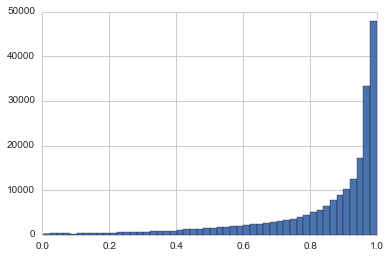

In [6]:
d_gdsc['AUC'].hist(bins=50)

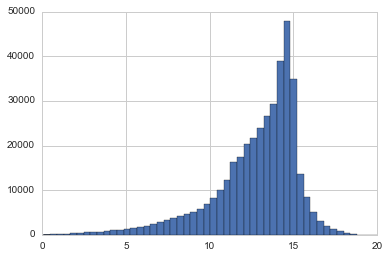

In [7]:
d_ctd['AUC'].hist(bins=50)

# GI50

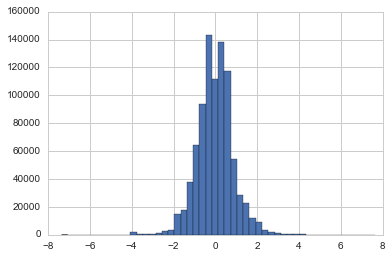

In [11]:
d_nci['GI50_ZSCORE'].hist(bins=50)

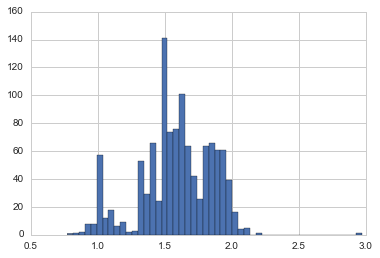

In [12]:
d_ncidream['LN_GI50'].hist(bins=50)

# Drug Data Export

In [85]:
d = '/Users/eczech/data/research/mgds/export/superset/mgds.csv.db/drug_sensitivity_summary_data.csv'
d = pd.read_csv(d, na_values=[''], low_memory=False)
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1650655 entries, 0 to 1650654
Data columns (total 19 columns):
CELL_LINE_ID_MGDS       1650655 non-null object
DRUG_NAME_MGDS          1650561 non-null object
DRUG_NAME_SOURCE        1650655 non-null object
EXPERIMENT_ID           1239218 non-null object
FDA_STATUS              19998 non-null object
PRIMARY_SITE_MGDS       860335 non-null object
SOURCE                  1650655 non-null object
SOURCE_N                1650655 non-null int64
TARGET                  408442 non-null object
TARGET_PATHWAY          411437 non-null object
MEASURE_UNIT            1650655 non-null object
MEASURE_VALUE           1650655 non-null float64
MEASURE_VALUE_Z         1650655 non-null float64
MEASURE_VALUE_STD       1650655 non-null float64
MEASURE_VALUE_MEAN      1650655 non-null float64
MEASURE_N               1650655 non-null int64
MEASURE_VALUE_Z_MEAN    1650655 non-null float64
MEASURE_VALUE_Z_STD     1650655 non-null float64
SOURCE_NAME             

In [110]:
d[d['SOURCE_N']> 1]['MEASURE_VALUE_Z'].describe()

count    370095.000000
mean          0.001491
std           1.016759
min         -59.990286
25%          -0.492811
50%           0.103470
75%           0.571543
max          17.226058
Name: MEASURE_VALUE_Z, dtype: float64

In [103]:
# sns.FacetGrid(d, col='SOURCE', col_wrap=2, sharex=False, sharey=False, size=10)\
#     .map(sns.countplot, 'MEASURE_N')

In [104]:
d['SOURCE'].value_counts()

ctd_v2         774260
nci60_v2       464958
gdsc_v2        410296
ncidream_v1      1141
Name: SOURCE, dtype: int64

In [105]:
d_plt = d[d['SOURCE_N'] > 1]
d_plt.head()

,CELL_LINE_ID_MGDS,DRUG_NAME_MGDS,DRUG_NAME_SOURCE,EXPERIMENT_ID,FDA_STATUS,PRIMARY_SITE_MGDS,SOURCE,SOURCE_N,TARGET,TARGET_PATHWAY,MEASURE_UNIT,MEASURE_VALUE,MEASURE_VALUE_Z,MEASURE_VALUE_STD,MEASURE_VALUE_MEAN,MEASURE_N,MEASURE_VALUE_Z_MEAN,MEASURE_VALUE_Z_STD,SOURCE_NAME
7164,CAS1,GOSSYPOL,gossypol,1,NaN,NaN,ctd_v2,2,NaN,NaN,LOG2_EC50,4.678,0.755883,0.0,4.678,1,0.755883,0.0,CTD
7165,CAS1,GOSSYPOL,gossypol,1,NaN,NaN,ctd_v2,2,NaN,NaN,AUC,14.385,1.287092,0.0,14.385,1,1.287092,0.0,CTD
7166,KPL1,GOSSYPOL,gossypol,2,NaN,NaN,ctd_v2,2,NaN,NaN,LOG2_EC50,6.878,1.647833,0.0,6.878,1,1.647833,0.0,CTD
7167,KPL1,GOSSYPOL,gossypol,2,NaN,NaN,ctd_v2,2,NaN,NaN,AUC,13.708,0.643527,0.0,13.708,1,0.643527,0.0,CTD
7168,MKN1,GOSSYPOL,gossypol,3,NaN,NaN,ctd_v2,2,NaN,NaN,LOG2_EC50,3.428,0.249092,0.0,3.428,1,0.249092,0.0,CTD


In [108]:
traces = []
for k, g in d_plt.groupby(['DRUG_NAME_MGDS', 'MEASURE_UNIT', 'SOURCE']):
#     if k != 'AFATINIB':
#         continue
    drug, unit, source = k
    def get_trace():
        return go.Scatter(
            x=g['CELL_LINE_ID_MGDS'],
            y=g['MEASURE_VALUE_Z'],
            name='{} {} {}'.format(drug, source, unit),
            visible='legendonly',
            mode='markers'
        )

    traces.append(get_trace())
fig = go.Figure(data=traces)
plty.offline.iplot(fig)

In [44]:
# d1 = d[d['SOURCE'] == 'NCI60']
# d1 = d1.groupby(['CELL_LINE_ID_MGDS', 'DRUG_NAME_MGDS'])['GI50_ZSCORE'].first()
# d1.head()

d1 = d[d['SOURCE'] == 'CTD']
d1 = d1.groupby(['CELL_LINE_ID_MGDS', 'DRUG_NAME_MGDS'])['AUC'].mean()
d1 = d1.rename('CTD_AUC')
d1.head()

CELL_LINE_ID_MGDS  DRUG_NAME_MGDS
2004               17AAG             11.8290
                   AC220             10.8410
                   AFATINIB           9.8492
                   ALVOCIDIB          7.0814
                   ATRA              12.7440
Name: CTD_AUC, dtype: float64

In [45]:
# d2 = d[d['SOURCE'] == 'GDSC']
# d2 = d2.groupby(['CELL_LINE_ID_MGDS', 'DRUG_NAME_MGDS'])['LN_IC50'].first()
# d2.head()

d2 = d[d['SOURCE'] == 'GDSC']
d2 = d2.groupby(['CELL_LINE_ID_MGDS', 'DRUG_NAME_MGDS'])['AUC'].mean()
d2 = d2.rename('GDSC_AUC')
d2.head()

CELL_LINE_ID_MGDS  DRUG_NAME_MGDS
201T               17AAG             0.648764
                   AC220             0.923796
                   ATRA              0.970735
                   AXITINIB          0.960433
                   AZD6482           0.926949
Name: GDSC_AUC, dtype: float64

In [46]:
d_plt = pd.concat([d1, d2], axis=1)
d_plt.head()

CTD_AUC  GDSC_AUC
CELL_LINE_ID_MGDS DRUG_NAME_MGDS                   
2004              17AAG           11.8290       NaN
                  AC220           10.8410       NaN
                  AFATINIB         9.8492       NaN
                  ALVOCIDIB        7.0814       NaN
                  ATRA            12.7440       NaN

In [47]:
traces = []
for k, g in d_plt.reset_index().groupby('DRUG_NAME_MGDS'):  
    trace = go.Scatter(
        x=g[d1.name], 
        y=g[d2.name], 
        text=g['CELL_LINE_ID_MGDS'],
        mode='markers',
        name=k
    )
    traces.append(trace)
fig = go.Figure(data=traces)
plty.offline.iplt(fig)